# Исследование рынка заведений общественного питания в Москве

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Исследования по заказу инвестиционного фонда «Shut Up and Take My Money», планируется открытие заведения общественного питания в Москве, исследование необходимо для определения формата заведения, месторасположения, среднего чека и меню. 
Необходимо подготовить исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Для исследования предоставлен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

План проекта:

1. Загрузка данных и изучение информации
2. Предобработка данных (проверка на дубликаты, пропуски, корректировка типов данных по необходимости)
3. Исследовательский анализ данных
* Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации.
* Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построем визуализации. 
* Рассмотрим соотношение сетевых и несетевых заведений в датасете, исследуем какие категории заведений чаще являются сетевыми.
* Найдем топ-15 популярных сетей в Москве. Построим визуализации. 
* Исследуем общее количество заведений и количество заведений каждой категории по районам Москвы. Проиллюстрируем эту информацию.
* Визуализируем распределение средних рейтингов по категориям заведений. 
* Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. 
* Исследуем улицы, на которых находится только один объект общепита, найдем закономерности.
* Исследуем данные по средним чекам заведений, используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Исследуем зависимость цен в заведениях от удалённости от центра.
* Общий вывод по разделу.
4. Детализированное исследование (детально рассмотрим информацию о кофейнях, инвесторы склоняются к формату кофейни, вдохновленные образом "Central Perk" из легендарного сериала "Друзья"), ответим на следующие вопросы:
* Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
* Есть ли круглосуточные кофейни?
* Какие у кофеен рейтинги? Как они распределяются по районам?
* На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
* Какая вместимость кофеен, есть ли зависимость цены и месторасположения?
* Построим визуализации 
* Рекомендации для открытия нового заведения
5. Подготовка презентации


In [2]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
import seaborn as sns
import re
import warnings

## Загрузка данных и изучение информации

In [4]:
data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,8406.0,55.750109,0.069658,55.573942,55.705155,55.753425,55.795041,55.928943
lng,8406.0,37.608570,0.098597,37.355651,37.538583,37.605246,37.664792,37.874466
rating,8406.0,4.229895,0.470348,1.000000,4.100000,4.300000,4.400000,5.000000
middle_avg_bill,3149.0,958.053668,1009.732845,0.000000,375.000000,750.000000,1250.000000,35000.000000
middle_coffee_cup,535.0,174.721495,88.951103,60.000000,124.500000,169.000000,225.000000,1568.000000
chain,8406.0,0.381275,0.485729,0.000000,0.000000,0.000000,1.000000,1.000000
seats,4795.0,108.421689,122.833396,0.000000,40.000000,75.000000,140.000000,1288.000000


Максимальное значение по столбцу среднего чека: 35000, скорее всего это выброс и эти данные нужно будет удалить, проверим подробнее.

## Предобработка данных

In [7]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В датафрейме достаточно большое количество пропусков, по столбцам price, middle_avg_bill, avg_bill, middle_coffee_cup пропусков более 50%. Заполнить пропуски не получится, это может исказить общую картину. 

Проверка на дубликаты - явных дубликатов не обнаружено

In [6]:
data.duplicated().sum()

0

Проверка на явные совпадения по строкам имя и адрес

In [7]:
data.duplicated(subset=['name', 'address']).sum()

0

Приведем названия заведений к одному знаменателю и удалим пробелы, чтобы найти неявные дубликаты

In [8]:
def clean_name(row):
    
    return re.sub(r'[^а-яА-ЯёЁa-zA-Z ]', '', row['name']).strip().lower()

data['clean_name'] = data.apply(clean_name, axis=1)

In [9]:
data.duplicated(subset=['clean_name', 'address']).sum()

5

In [10]:
data=data.drop_duplicates(subset=['clean_name', 'address'])

Найдено и удалено 5 дубликатов, проверим количество удаленных значений:

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8401 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8401 non-null   object 
 1   category           8401 non-null   object 
 2   address            8401 non-null   object 
 3   district           8401 non-null   object 
 4   hours              7866 non-null   object 
 5   lat                8401 non-null   float64
 6   lng                8401 non-null   float64
 7   rating             8401 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8401 non-null   int64  
 13  seats              4791 non-null   float64
 14  clean_name         8401 non-null   object 
dtypes: float64(6), int64(1), object(8)
memory usage: 1.0+ MB


Вывод по блоку "Предобработка данных": мы ознакомились с типоми данных и количеством пропусков в датафрейме, проверили и удалили дубликаты. Данные готовы к исследовательскому анализу. 

## Исследовательский анализ данных

Ознакомимся с количеством уникальных значений в каждом столбце

In [12]:
data.nunique()
data['category'].value_counts()

name                 5612
category                8
address              5753
district                9
hours                1305
lat                  8205
lng                  8254
rating                 41
price                   4
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
clean_name           5386
dtype: int64

Рассмотрим полноту данных в разрезе категорий, т.к, заказчика в первую очередь интересует формат кофейни, то акцентируем внимание на этих данных: часы работы у нас есть почти во всех заведениях, ценовая категория есть только у трети заведений этой категории, средний чек только у 200 кофеен из 1412, средняя стоимость чашки кофе только у 521 кофейни

In [13]:
data.groupby('category').agg('count')

,name,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,clean_name
category,,,,,,,,,,,,,,
"бар,паб",764,764,764,746,764,764,764,494,485,349,6,764,467,764
булочная,256,256,256,249,256,256,256,41,53,53,0,256,148,256
быстрое питание,603,603,603,570,603,603,603,190,238,237,1,603,349,603
кафе,2377,2377,2377,2003,2377,2377,2377,633,698,694,4,2377,1217,2377
кофейня,1412,1412,1412,1397,1412,1412,1412,476,721,200,521,1412,751,1412
пиццерия,633,633,633,628,633,633,633,311,400,395,3,633,427,633
ресторан,2041,2041,2041,1967,2041,2041,2041,1017,1040,1040,0,2041,1268,2041
столовая,315,315,315,306,315,315,315,153,181,181,0,315,164,315


In [14]:
data['category'].value_counts()

кафе               2377
ресторан           2041
кофейня            1412
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [15]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,8401.0,55.750082,0.069663,55.573942,55.704882,55.753395,55.795022,55.928943
lng,8401.0,37.608616,0.098584,37.355651,37.538648,37.605260,37.664827,37.874466
rating,8401.0,4.230127,0.469960,1.000000,4.100000,4.300000,4.400000,5.000000
middle_avg_bill,3149.0,958.053668,1009.732845,0.000000,375.000000,750.000000,1250.000000,35000.000000
middle_coffee_cup,535.0,174.721495,88.951103,60.000000,124.500000,169.000000,225.000000,1568.000000
chain,8401.0,0.381145,0.485697,0.000000,0.000000,0.000000,1.000000,1.000000
seats,4791.0,108.342308,122.846815,0.000000,40.000000,75.000000,140.000000,1288.000000


Максимальное значение среднего чека 35000 - это явный выброс, очистим данные

In [16]:
data= data.loc[data['middle_avg_bill'] != 35000]

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8400 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8400 non-null   object 
 1   category           8400 non-null   object 
 2   address            8400 non-null   object 
 3   district           8400 non-null   object 
 4   hours              7865 non-null   object 
 5   lat                8400 non-null   float64
 6   lng                8400 non-null   float64
 7   rating             8400 non-null   float64
 8   price              3314 non-null   object 
 9   avg_bill           3815 non-null   object 
 10  middle_avg_bill    3148 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8400 non-null   int64  
 13  seats              4790 non-null   float64
 14  clean_name         8400 non-null   object 
dtypes: float64(6), int64(1), object(8)
memory usage: 1.0+ MB


Добавим столбец с названием улицы

In [18]:
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'аллея','бульвар','набережная','тупик','линия']

format = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

data['street'] = data['address'].str.extract(format)

In [19]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,clean_name,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,wowфли,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,четыре комнаты,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,хазри,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,dormouse coffee shop,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,иль марко,Правобережная улица


Добавим столбец с категорией круглосуточного режима работы "24/7" 

In [20]:
data['24/7'] = data.apply(lambda x: x['hours'] == 'ежедневно, круглосуточно', axis = 1)

Рассмотрим медианные значения среднего чека в разрезе районов города Москвы:

In [21]:
data.groupby('district')['middle_avg_bill'].agg('median')

district
Восточный административный округ            575.0
Западный административный округ            1000.0
Северный административный округ             650.0
Северо-Восточный административный округ     500.0
Северо-Западный административный округ      700.0
Центральный административный округ         1000.0
Юго-Восточный административный округ        450.0
Юго-Западный административный округ         600.0
Южный административный округ                500.0
Name: middle_avg_bill, dtype: float64

Самые высокие значения в Центральном и Западном районах, в остальных районах средний чек на 30-40% ниже

Рассмотрим распределение заведений общественного питания по районам города Москвы

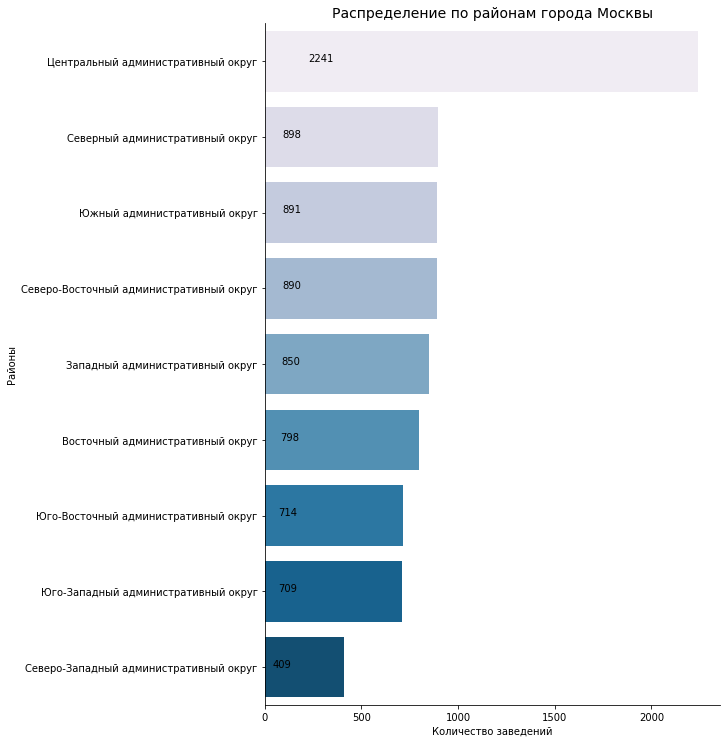

In [22]:
data_grouped = data.groupby('district')['name'].count().reset_index()
    
data_grouped= data_grouped.sort_values(by='name', ascending=False)
g = sns.catplot(data=data_grouped, kind='bar', x='name', y='district', palette='PuBu', height=10)

for i in range(data_grouped.shape[0]):
    g.ax.text(data_grouped.iloc[i]['name'] // 10, i, data_grouped.iloc[i]['name'])

plt.title('Распределение по районам города Москвы', fontsize=14)
plt.xlabel('Количество заведений')
plt.ylabel('Районы')
plt.show()

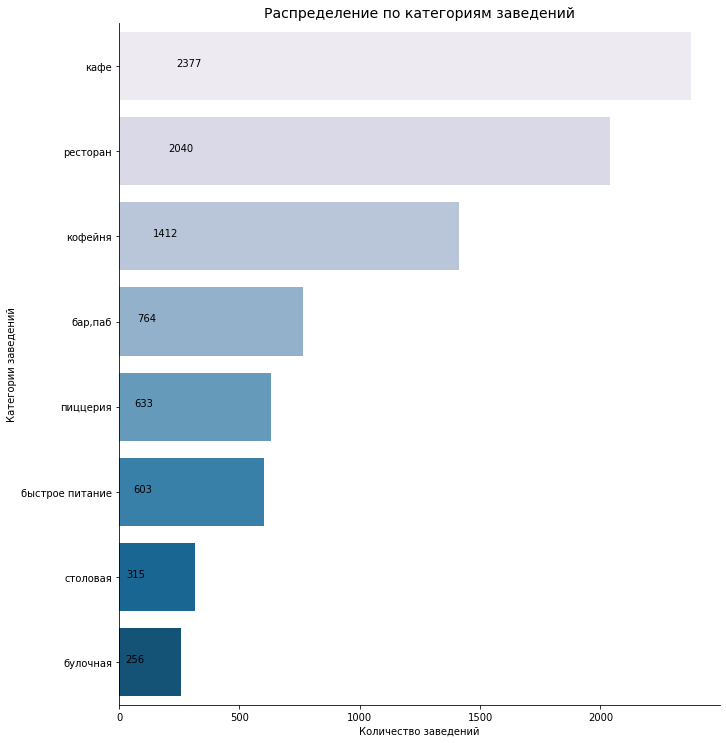

In [23]:
data_grouped = data.groupby('category')['name'].count().reset_index()
data_grouped= data_grouped.sort_values(by='name', ascending=False)   

g = sns.catplot(data=data_grouped, kind='bar', x='name', y='category', palette='PuBu', height=10)

for i in range(data_grouped.shape[0]):
    g.ax.text(data_grouped.iloc[i]['name'] // 10, i, data_grouped.iloc[i]['name'])
plt.title('Распределение по категориям заведений', fontsize=14)
plt.xlabel('Количество заведений')
plt.ylabel('Категории заведений')        
plt.show()

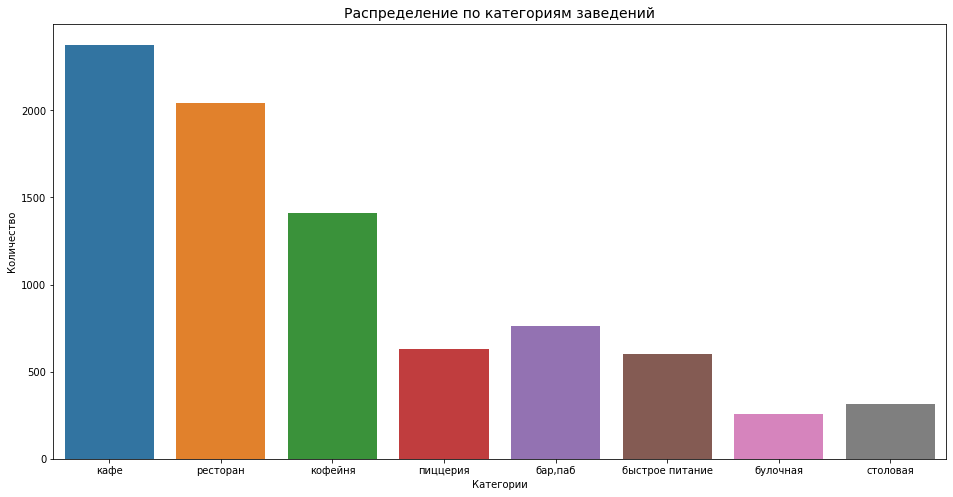

In [24]:
warnings.simplefilter('ignore')
plt.figure(figsize=(16, 8))
sns.countplot(data['category'])
plt.title('Распределение по категориям заведений', fontsize=14)
plt.xlabel('Категории')
plt.ylabel('Количество');

Топ-3 категорий заведений общественного питания в Москве:
1. Кафе 2377
2. Рестораны 2040
3. Кофейни 1412

Остальные категории существенно менее распространены

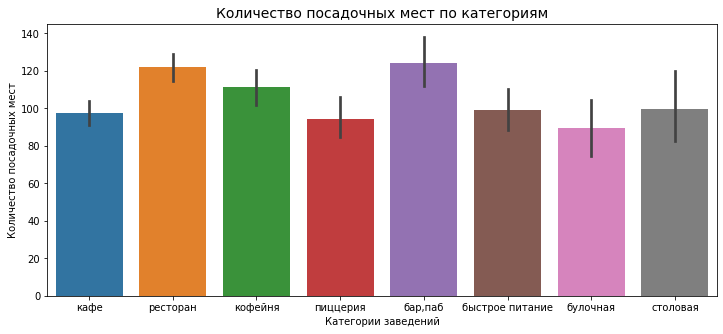

In [25]:
plt.figure(figsize=(12, 5))
ax = sns.barplot(x='category', y='seats', data=data) 
plt.title('Количество посадочных мест по категориям', fontsize=14)
plt.xlabel('Категории заведений')
plt.ylabel('Количество посадочных мест');

Рассмотрим средние и медианные показатели по количеству посадочных мест по категориям заведений, интересно, что очень большие цифры в категории кофейня, обычно такой формат предпалагает небольшие заведения с малым количеством посадочных мест, из данных мы видим, что в Москве заведения такой категории достаточно крупные и вместительные, практически не уступают по данному показателю ресторанам и барам

In [26]:
data.pivot_table(index=['category'], values=['seats'], aggfunc=['mean', 'median'])


,mean,median
,seats,seats
category,,
"бар,паб",124.477516,82.0
булочная,89.385135,50.0
быстрое питание,98.891117,65.0
кафе,97.365653,60.0
кофейня,111.199734,80.0
пиццерия,94.496487,55.0
ресторан,121.847672,86.0
столовая,99.750000,75.5


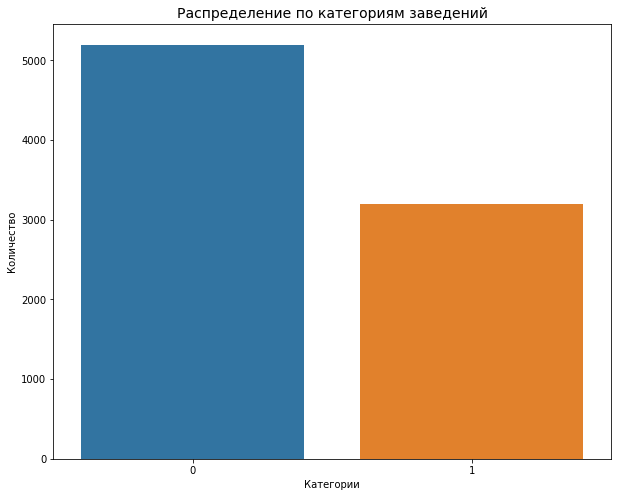

In [27]:
plt.figure(figsize=(10, 8))
sns.countplot(data['chain'])
plt.title('Распределение по категориям заведений', fontsize=14)
plt.xlabel('Категории')
plt.ylabel('Количество');

In [28]:
data_chain = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')  
data_chain.columns=['не сетевые', 'сетевые']
data_chain['итого']=data_chain['не сетевые']+data_chain['сетевые']
data_chain['% сетевых']=data_chain['сетевые']/data_chain['итого']*100
data_chain

,не сетевые,сетевые,итого,% сетевых
category,,,,
"бар,паб",596,168,764,21.989529
булочная,99,157,256,61.328125
быстрое питание,371,232,603,38.474295
кафе,1598,779,2377,32.772402
кофейня,693,719,1412,50.920680
пиццерия,303,330,633,52.132701
ресторан,1311,729,2040,35.735294
столовая,227,88,315,27.936508


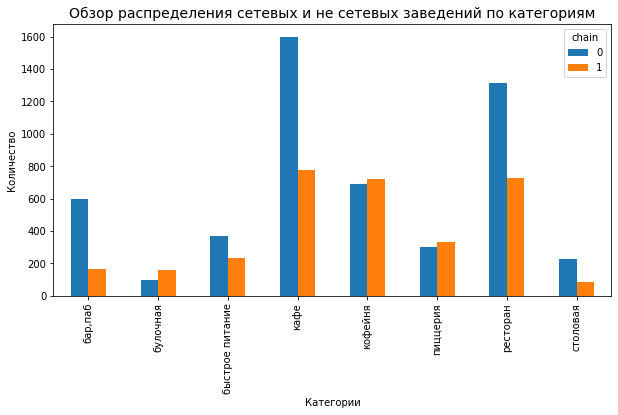

In [29]:
data_pivot_chain = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count').plot(kind='bar', figsize=(10,5))

plt.title('Обзор распределения сетевых и не сетевых заведений по категориям', fontsize=14)
plt.xlabel('Категории')
plt.ylabel('Количество');

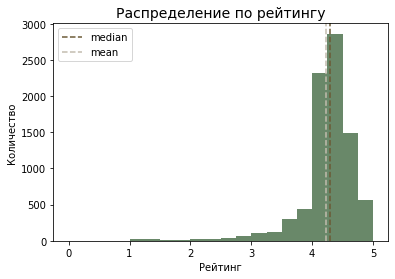

In [30]:
plt.hist(data['rating'], bins=20, color='#698869', range = (0, 5))
plt.axvline(data['rating'].median(), color='#6B5935', linestyle= '--', label='median')
plt.axvline(data['rating'].mean(), color='#C3BCAE', linestyle= '--', label='mean')
plt.title('Распределение по рейтингу', fontsize=14)
plt.xlabel('Рейтинг')
plt.ylabel('Количество')
plt.legend();

Общее распределение по среднему чеку: мы видим, что медианное значение находится в районе 750 рублей, среднее в районе 900 рублей, самое большое количество заведений в датасете со средним чеком 350-400 рублей.

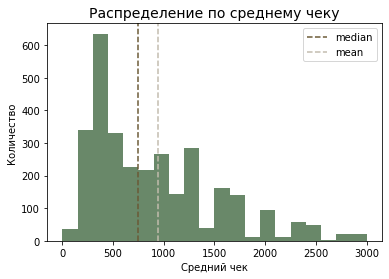

In [31]:
plt.hist(data['middle_avg_bill'], bins=20, color='#698869', range = (0, 3000))
plt.axvline(data['middle_avg_bill'].median(), color='#6B5935', linestyle= '--', label='median')
plt.axvline(data['middle_avg_bill'].mean(), color='#C3BCAE', linestyle= '--', label='mean')
plt.title('Распределение по среднему чеку', fontsize=14)
plt.xlabel('Средний чек')
plt.ylabel('Количество')
plt.legend();

Рассмотрим распределение по количеству посадочных мест: среднее значение в районе 105, делиана - 75-80 посадочных мест, наибольшее количество заведений с количеством позадочных мест 30-50

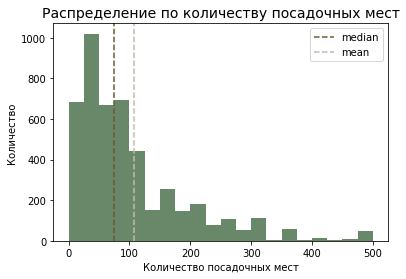

In [32]:
plt.hist(data['seats'], bins=20, color='#698869', range = (0, 500))
plt.axvline(data['seats'].median(), color='#6B5935', linestyle= '--', label='median')
plt.axvline(data['seats'].mean(), color='#C3BCAE', linestyle= '--', label='mean')
plt.title('Распределение по количеству посадочных мест', fontsize=14)
plt.xlabel('Количество посадочных мест')
plt.ylabel('Количество')
plt.legend();

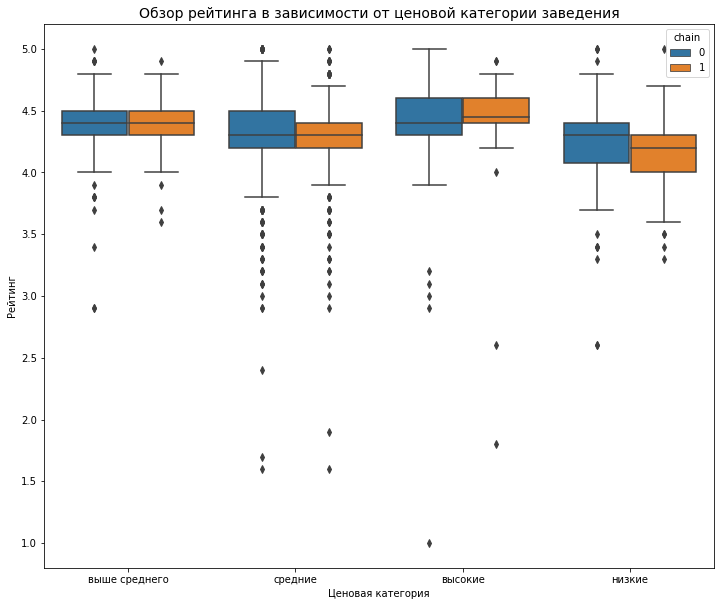

In [33]:
plt.figure(figsize=(12, 10))
ax = sns.boxplot(x='price', y='rating', hue='chain', data=data) 
plt.title('Обзор рейтинга в зависимости от ценовой категории заведения', fontsize=14)
plt.xlabel('Ценовая категория')
plt.ylabel('Рейтинг');

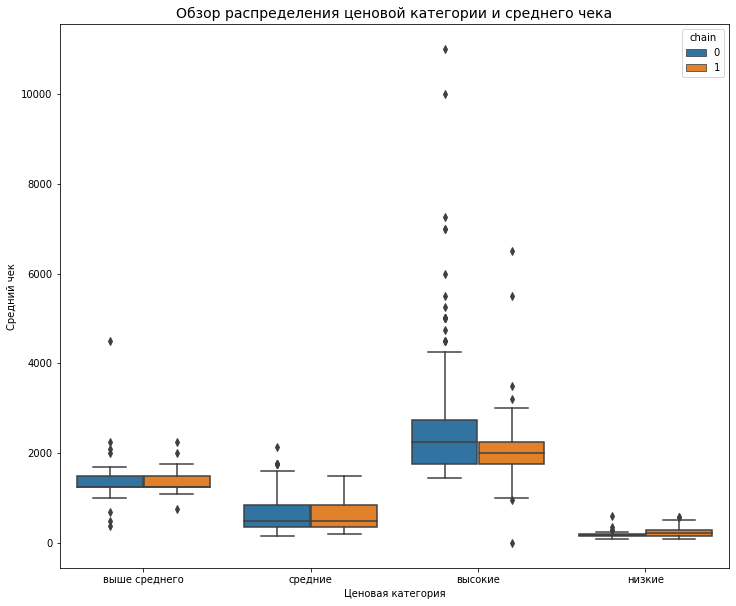

In [34]:
plt.figure(figsize=(12, 10))
ax = sns.boxplot(x='price', y='middle_avg_bill', hue='chain', data=data) 
plt.title('Обзор распределения ценовой категории и среднего чека', fontsize=14)
plt.xlabel('Ценовая категория')
plt.ylabel('Средний чек');

Исследуем количество заведений каждой категории по районам Москвы

In [35]:
data.pivot_table(index='district', columns='category', values='name', aggfunc='count')

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,238,150,71,218,24
Северный административный округ,68,39,58,235,192,77,188,41
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,669,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,201,44


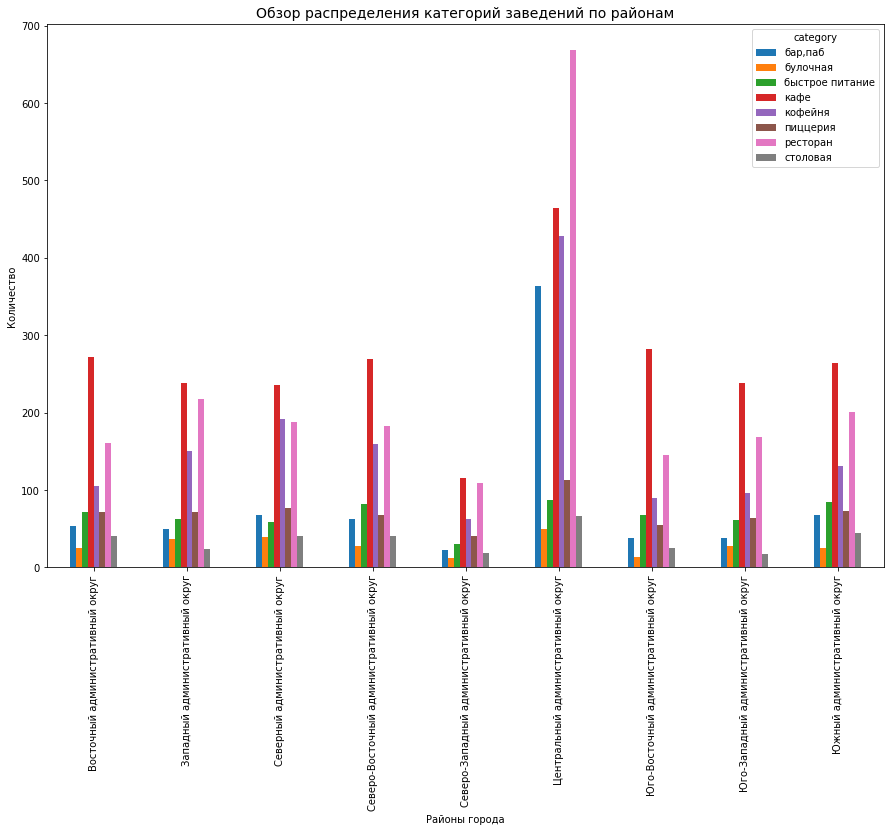

In [36]:
data.pivot_table(index='district', columns='category', values='name', aggfunc='count').plot(kind='bar', figsize=(15,10))
plt.title('Обзор распределения категорий заведений по районам', fontsize=14)
plt.xlabel('Районы города')
plt.ylabel('Количество');

Рассмотрим как распределены по районам города заведения по ценовым категориям, логично, что самая высокая концентрация заведений высокого ценового сегмента сосредоточена в центральном районе 

In [37]:
data.pivot_table(index='district', columns='price', values='name', aggfunc='count')

price,высокие,выше среднего,низкие,средние
district,,,,
Восточный административный округ,27,30,18,169
Западный административный округ,51,68,11,177
Северный административный округ,50,47,18,228
Северо-Восточный административный округ,18,41,21,229
Северо-Западный административный округ,14,21,3,108
Центральный административный округ,271,240,34,666
Юго-Восточный административный округ,8,23,15,153
Юго-Западный административный округ,21,41,15,168
Южный административный округ,17,53,21,219


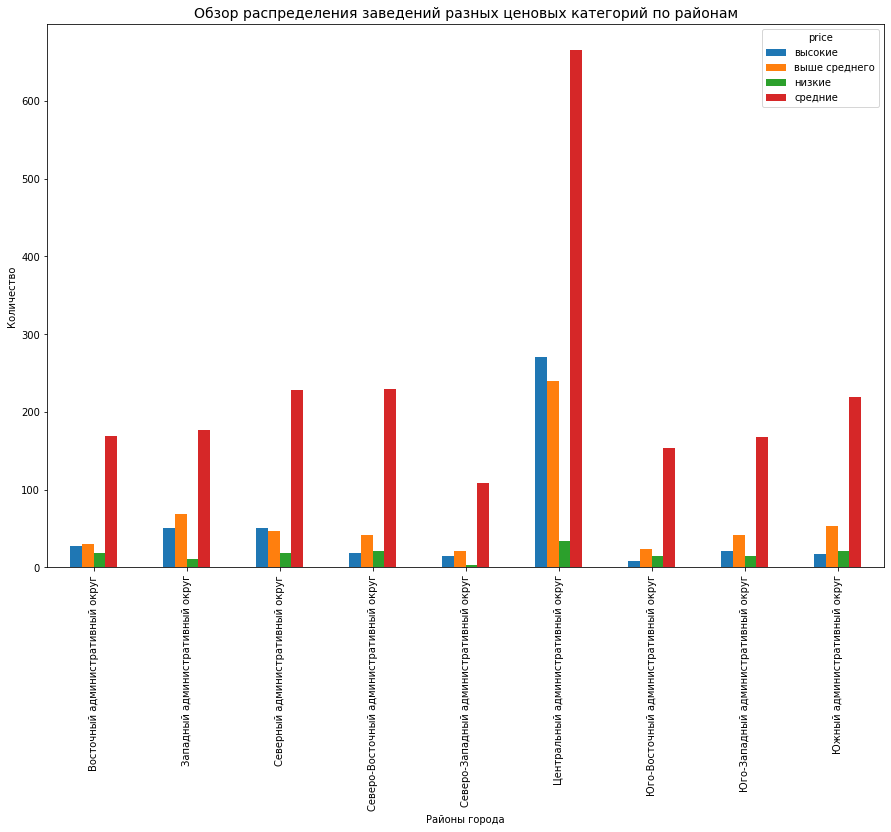

In [38]:
data.pivot_table(index='district', columns='price', values='name', aggfunc='count').plot(kind='bar', figsize=(15,10))
plt.title('Обзор распределения заведений разных ценовых категорий по районам', fontsize=14)
plt.xlabel('Районы города')
plt.ylabel('Количество');

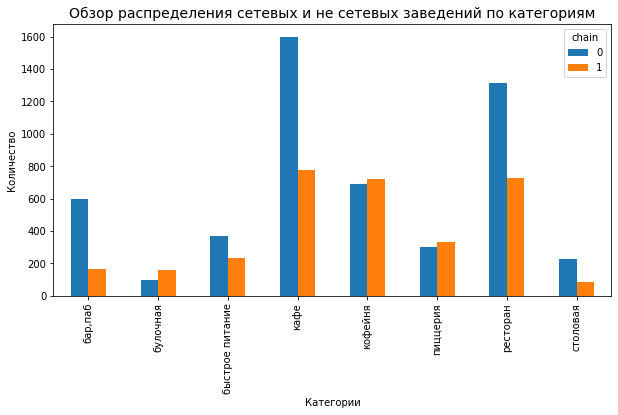

In [39]:
data_pivot_chain = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count').plot(kind='bar', figsize=(10,5))

plt.title('Обзор распределения сетевых и не сетевых заведений по категориям', fontsize=14)
plt.xlabel('Категории')
plt.ylabel('Количество');

In [40]:
data_chain

,не сетевые,сетевые,итого,% сетевых
category,,,,
"бар,паб",596,168,764,21.989529
булочная,99,157,256,61.328125
быстрое питание,371,232,603,38.474295
кафе,1598,779,2377,32.772402
кофейня,693,719,1412,50.920680
пиццерия,303,330,633,52.132701
ресторан,1311,729,2040,35.735294
столовая,227,88,315,27.936508


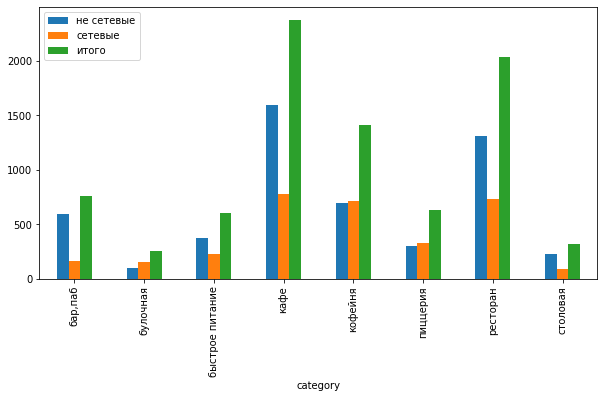

In [41]:
chain = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')  
chain.columns=['не сетевые', 'сетевые']
chain['итого']=data_chain['не сетевые']+data_chain['сетевые']
chain.plot(kind='bar', figsize=(10,5));

Проанализировали соотношение сетевых/не сетевых заведений в каждой категории, наибольшая доля сетевых заведений в категориях:
1. Булочные 61%
2. Пиццерии 52%
3. Кофейни 51%

In [42]:
data['street'].value_counts().head(15)

проспект Мира             183
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            76
Варшавское шоссе           75
Ленинградское шоссе        69
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Алтуфьевское шоссе         47
Name: street, dtype: int64

In [43]:
data_top_street = data[data['street'].isin(['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского', 'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе', 'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект', 'улица Миклухо-Маклая', 'Пятницкая улица', 'Алтуфьевское шоссе'])]

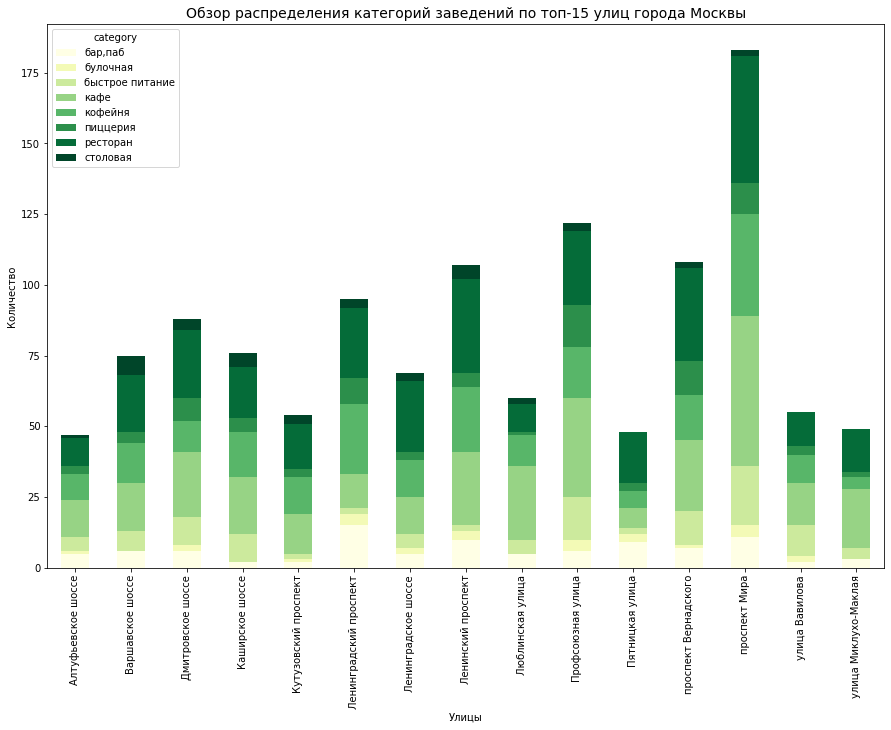

In [44]:
data_top_street.pivot_table(index='street', columns='category', values='name', aggfunc='count').plot(kind='bar', stacked=True, colormap='YlGn', rot=90, figsize=(15,10))
plt.title('Обзор распределения категорий заведений по топ-15 улиц города Москвы', fontsize=14)
plt.xlabel('Улицы')
plt.ylabel('Количество');

<AxesSubplot:xlabel='category'>

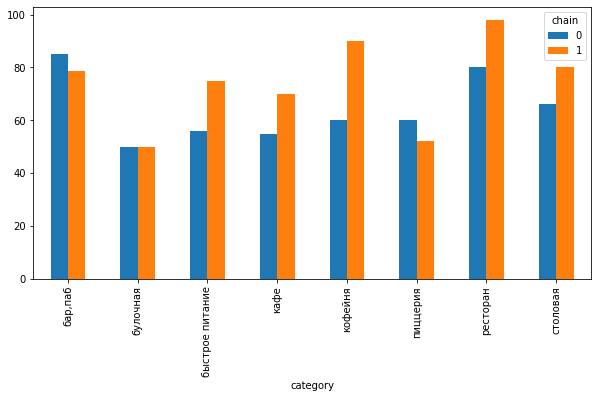

In [45]:
data.pivot_table(index='category', columns='chain', values='seats', aggfunc='median').plot(kind='bar', figsize=(10,5))

In [46]:
data_district = data.groupby('district', as_index=False)['rating'].agg('mean')

import json
 
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
 
# импортируем карту и хороплет
from folium import Map, Choropleth
 
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
 
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
 
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений общественного питания по районам',
).add_to(m)
 
# выводим карту
m

In [47]:
data_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('mean')

import json
 
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
 
# импортируем карту и хороплет
from folium import Map, Choropleth
 
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
 
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
 
Choropleth(
    geo_data=state_geo,
    data=data_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений общественного питания по среднему чеку',
).add_to(m)
 
# выводим карту
m

In [48]:

from folium import Marker

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
data.apply(create_marker, axis=1)
    
# выводим карту
m


<div class="alert alert-success">
<b>Комментарий ревьюера:</b>☀️Хорошо!</div>

Вывод: Мы исследовали распределение заведений по районам города, по среднему чеку, количеству посадочныз мест и рейтингу. Ожидаемо, наибольшая плотность заведений общественного питания в Центральном районе, лидер среди категорий заведений в этом районе  - рестораны, на втором месте кафе и третьем кофейни. 
Рассмотрели средние и медианные показатели по количеству посадочных мест по категориям заведений, интересно, что очень большие цифры в категории кофейня, обычно такой формат предпалагает небольшие заведения с малым количеством посадочных мест, из данных мы видим, что в Москве заведения такой категории достаточно крупные и вместительные, практически не уступают по данному показателю ресторанам и барам.
Общее распределение по среднему чеку: мы видим, что медианное значение находится в районе 750 рублей, среднее в районе 900 рублей, самое большое количество заведений в датасете со средним чеком 350-400 рублей. Распределение по количеству посадочных мест следующее: среднее значение в районе 105, медиана - 75-80 посадочных мест, наибольшее количество заведений с количеством позадочных мест 30-50



<div class="alert alert-success">
<b>Комментарий ревьюера:</b>☀️Молодец, что даешь промежуточные выводы после блоков кода.</div>

## Детализированное исследование кофеен

Исследуем рынок общественных заведений категории "кофейня"

In [49]:
data_coffee = data[data['category'].isin(['кофейня'])]
data_coffee.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,clean_name,street,24/7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,dormouse coffee shop,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,в парке вкуснее,NaN,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,bar coffee,Коровинское шоссе,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,cofefest,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,cofix,улица Дыбенко,False
53,Royal Coffee,кофейня,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880622,37.448529,3.1,NaN,NaN,NaN,NaN,0,148.0,royal coffee,Правобережная улица,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,coffeekaldis,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,чебуречная история,NaN,False
64,Testo мания,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,0,NaN,testo мания,NaN,False
66,Молинари,кофейня,"Москва, Алтуфьевское шоссе, 70, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.887887,37.588294,4.8,NaN,NaN,NaN,NaN,0,120.0,молинари,Алтуфьевское шоссе,False



<div class="alert alert-warning">
<b>Комментарий ревьюера:</b>☀️Можно еще посмотреть, сколько у нас вообще кофеен. Сколько сетевых/несетевых и т.д.</div>

Распределение кофеен по районам в разрезе сетевые/не сетевые. Больше всего кофеен в Центральном районе, распределение между сетевыми и не сетевыми заведениями в районах достаточно равномерно, за исключением Западного и Юго_Восточного района

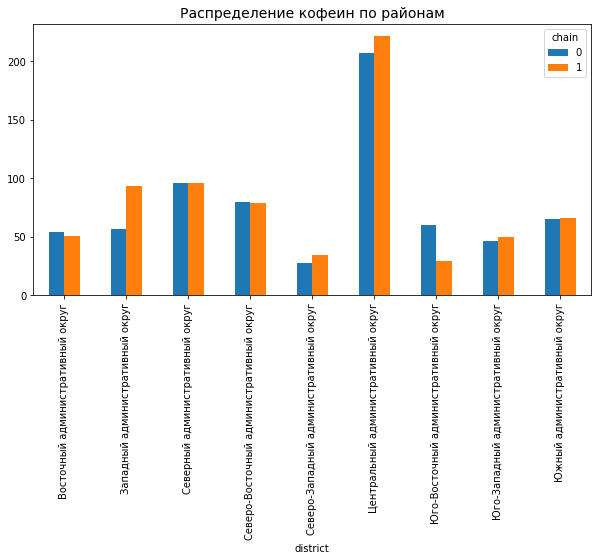

In [50]:

data_coffee.pivot_table(index='district', columns='chain', values='name', aggfunc='count').plot(kind='bar', figsize=(10,5))
plt.title('Распределение кофеин по районам', fontsize=14);

Рассмотрим распределение по районам в разрезе ценовой категории заведений, тут во всех районах превалируют кофейни среднего ценового сегмента, особенно в Центральном районе, но не будем забывать, что в исходном датафрейме категории есть только у трети кофеен, рассмотрим данные по средней стоимости чашки кофе

<AxesSubplot:xlabel='district'>

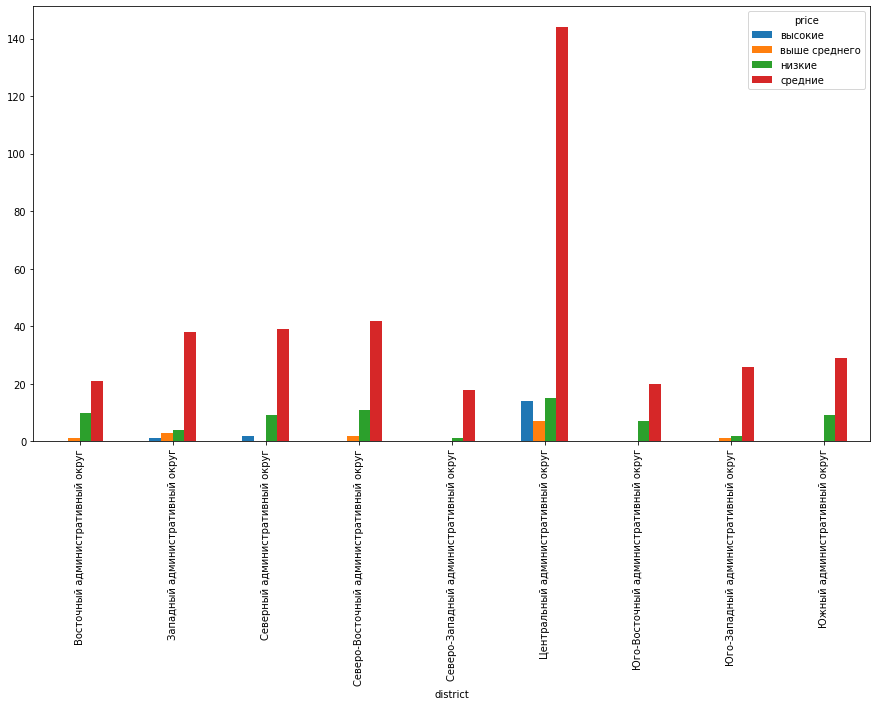

In [51]:
data_coffee.pivot_table(index='district', columns='price', values='name', aggfunc='count').plot(kind='bar', figsize=(15,8))

Рейтинг у кофеен во всех районах примерно на одном уровне, но прослеживается интересная закономерность, что во всех районах у не сетевых кофеен рейтинг выше 

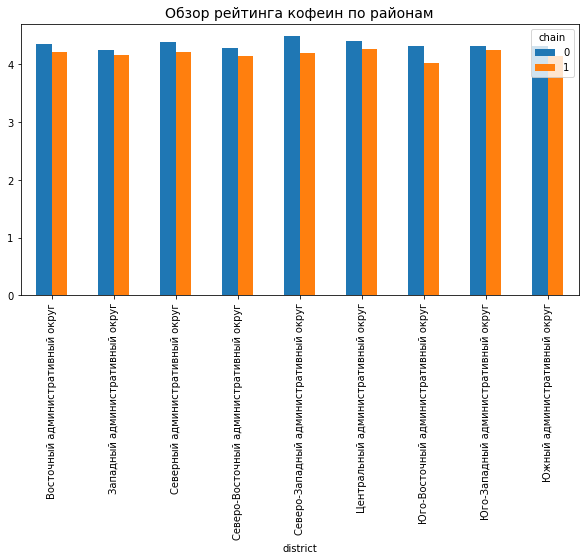

In [52]:
data_coffee.pivot_table(index='district', columns='chain', values='rating', aggfunc='mean').plot(kind='bar', figsize=(10,5))
plt.title('Обзор рейтинга кофеин по районам', fontsize=14);

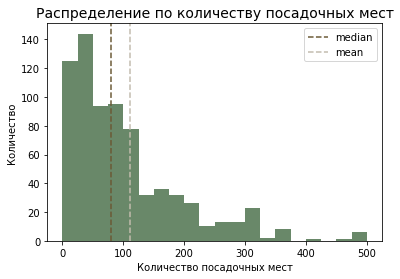

In [53]:
plt.hist(data_coffee['seats'], bins=20, color='#698869', range = (0, 500))
plt.axvline(data_coffee['seats'].median(), color='#6B5935', linestyle= '--', label='median')
plt.axvline(data_coffee['seats'].mean(), color='#C3BCAE', linestyle= '--', label='mean')
plt.title('Распределение по количеству посадочных мест', fontsize=14)
plt.xlabel('Количество посадочных мест')
plt.ylabel('Количество')
plt.legend();

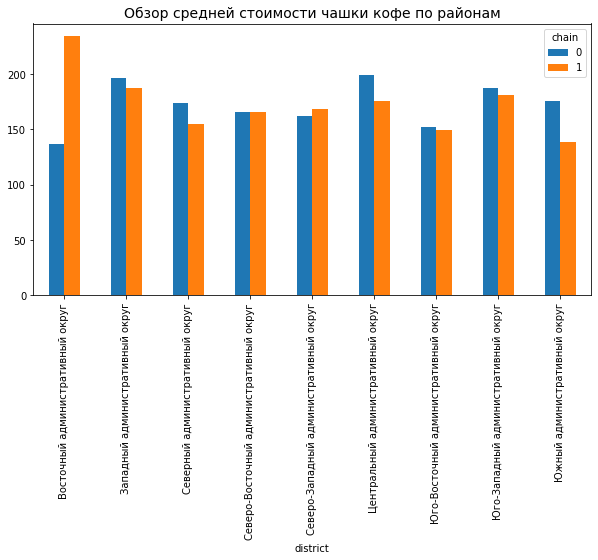

In [54]:
data_coffee.pivot_table(index='district', columns='chain', values='middle_coffee_cup', aggfunc='mean').plot(kind='bar', figsize=(10,5))
plt.title('Обзор средней стоимости чашки кофе по районам', fontsize=14);

Рассмотрим как распределена средняя цена чашки кофе в зависимости от ценовой категории кофейни. Здесь мы видим, что в средней ценовой категории (каких заведений наибольше количество) цена чашки кофе варьируется от 190-230 рублей, а низкой ценовой категории менее 150 рублей за чашку

<AxesSubplot:xlabel='price'>

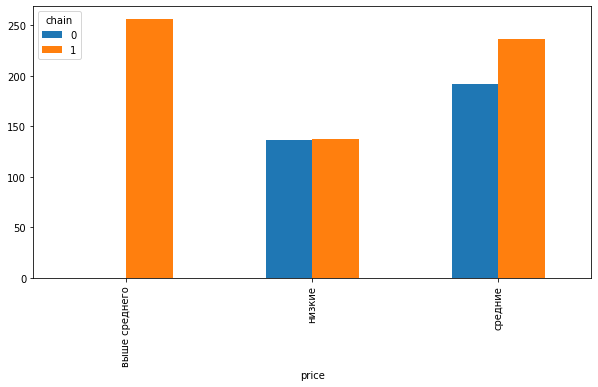

In [55]:
data_coffee.pivot_table(index='price', columns='chain', values='middle_coffee_cup', aggfunc='mean').plot(kind='bar', figsize=(10,5))

Рассмотрим топ-15 улиц с наибольшим количеством кофеен:

In [56]:
data_coffee['street'].value_counts().head(15)

проспект Мира             36
Ленинградский проспект    25
Ленинский проспект        23
Профсоюзная улица         18
Каширское шоссе           16
проспект Вернадского      16
Варшавское шоссе          14
Кутузовский проспект      13
Ленинградское шоссе       13
Новослободская улица      13
Новодмитровская улица     12
Люблинская улица          11
Дмитровское шоссе         11
улица Вавилова            10
Бутырская улица            9
Name: street, dtype: int64

Исследуем количество кофеен и соответственно среднюю и медианную стоимость чашки кофе на топ-15 улиц города Москвы по количеству кофеен

In [57]:
data_pivot=data_coffee.pivot_table(index=['street'], values=['middle_coffee_cup'], aggfunc=['count', 'mean', 'median'])
data_pivot.columns=[ 'count_coffee', 'mean_price_coffee', 'median_price_coffee']
data_pivot=data_pivot.sort_values(by='count_coffee', ascending=False).head(15)
data_pivot

,count_coffee,mean_price_coffee,median_price_coffee
street,,,
Ленинградский проспект,11,187.545455,180.0
проспект Мира,9,187.888889,220.0
Ленинский проспект,9,224.333333,227.0
Кутузовский проспект,6,201.000000,253.0
Профсоюзная улица,6,161.833333,150.0
Волгоградский проспект,6,152.333333,160.0
Новодмитровская улица,5,121.800000,95.0
Каширское шоссе,5,130.800000,140.0
Дмитровское шоссе,5,194.400000,180.0


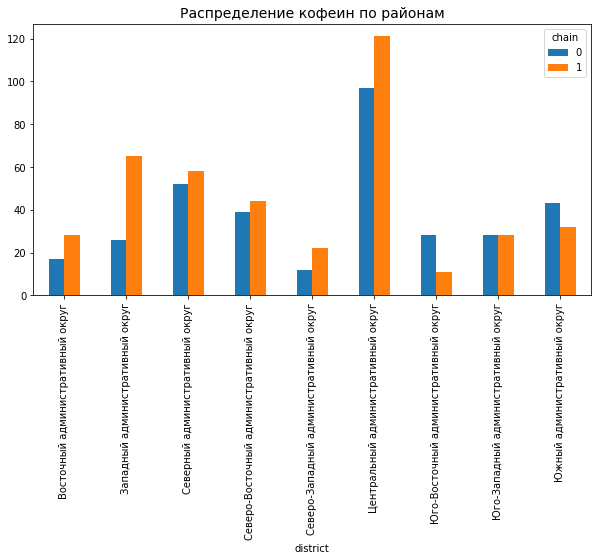

In [58]:
data_coffee.pivot_table(index='district', columns='chain', values='seats', aggfunc='count').plot(kind='bar', figsize=(10,5))
plt.title('Распределение кофеин по районам', fontsize=14);

In [59]:
data_coffee.pivot_table(index=['24/7'], values=['name'], aggfunc=['count'])

,count
,name
24/7,
False,1353
True,59


Круглосуточных кофеен всего 59 

## Общий вывод

В ходе исследования мы установили, что на рынке заведений общественного питания Москвы 1412 кофеен, примерно половина из них сетевые и только 59 работают круглосуточно. В Центральном административном районе сосредоточено самое большое количество коффеен, на Ленинградский проспект, Ленинскиом проспекте и проспекте Мира самая высокая плотность кофеен. 
Подавляющее количество кофеен в Центральном административном районе среднего ценового сегмента, где средняя стоимость чашки кофе варьируется в пределах 190-230 рублей. Средний рейтинг кофеен не сетевого формата устойчиво выше во всех районах города. Что касается количество посадочных мест, в Центральном районе наибольшее количество кофеен большой вместимости - более 80 посадочных мест. 
Что касается формата кофейни Central Perk из сериала "Друзья", здесь мы рассматриваем атмосферное заведение с ностальгическим  бэграундом и кинематографичным идейным форматом, это заведение может быть только в единственном уникальном экземпляре с расположением в Центральном административном районе, это же "Central Perk". На популярность и положительный финансовый результат такого формата заведения могут позитивно сказаться следующие факторы:
- Небольшой формат кофейни, в Центральном районе есть запрос на небольшие уютные кофейни, вместимость до 40 мест - это позволит сничить расходы на ремонт, оплату и содержанния помещения;
- Средняя стоимость чашки кофе - 150 рублей - это ниже средней цены в Центральном административном районе, но при этом цена не низкая, что сохраняет высокую маржинальность;
- Расположение в Центральном районе на улице с низкой плотностью кофеен;
- Заимстование элементов дизайна "Central Perk" из сериала Друзья.

Отсылка в формате и элементах дизайна к кинематографичному "Central Perk", создаст дополнительный интерес к заведению. Широкий формат аудитории, которые знают и любят сериал "Друзья" могут обеспечить дополнительный поток клиентов, как показывают исследования и рейтинги сериала, не смотря на то, что он выходил в период 1994-2004 года, аудитория широчйшего возрастного диапазона знает и любит этот ситком, который не рааз признавался лучшим за всю историю.